### Hypothesis 0

Generally, we want to investigate whether increasing depth of an encoder will let it remember acoustic features that allows it to remember the acoustic structure in the recordings

I train only ReLU activation functions as the others didn't seem to work correctly. I take two models that shown optimal results in -1 and autoencoder we would like to investigate

model list:
- dense_timed_simplest_dilated with separate axes
- dense_timed_simplest_dilated with common axes
- convolutional autoencoder from experiment -1
- variations on the same autoencoder with different depths of encoding

Keras optimizers for 0.001, 0.0001, 0.00001
9000 recordings
prepare the gsm.wavs
mean not removed, divided by STD, range from 0 to one digit number
if in 4 epochs the model doesnt improve == it has converged in that stage (change from 8 for faster convergence - we train multistage after all)

##### Imports and initialization

In [1]:
%matplotlib inline

import os,sys
#path = os.path.realpath(os.path.join(os.getcwd(), ".."))
path = "/home/zantyr/Denoising"
sys.path.append(path)
os.chdir(path)

import matplotlib.pyplot as plt
import numpy as np
import pickle
import scipy.io.wavfile as sio
import tempfile

from IPython.display import Image, Audio, display

import keras
from keras.utils.vis_utils import plot_model
from keras.layers         import Dropout, Input, Conv1D, Conv2D, AveragePooling2D, Flatten, Dense, Deconv2D, UpSampling2D, concatenate, BatchNormalization, Lambda, LeakyReLU, TimeDistributed, Reshape, LSTM, GaussianNoise
from keras.models         import Model
from keras.datasets.mnist import load_data
from keras.utils          import to_categorical
from keras.initializers   import Orthogonal
from keras.regularizers   import L1L2, l2
from keras.callbacks      import Callback
import keras.backend as K
import tensorflow as tf

import loaders
from loaders.transform import AddGaussianNoise, Windowing, GSMize, MixReverb, MixNoise, ConstantQTransform, Transcript, LengthOfWindow, Length, Lengthen, Null, DivisiblePad
from loaders.dataset import Dataset, enable_multiprocessing, disable_multiprocessing
from loaders.feature import NormalizedLogPowerRFFT, Trim
from loaders.experiment import SingleExperiment
from loaders.measures import MSE
from loaders.schedule import Schedule
from loaders.estimator import DefaultVisualizeTransform, Estimator
from loaders.extras import LossHistory, set_device, delog_griffin_lim, get_stft
from loaders.custom import identity_loss
set_device()               # switches to CPU if GPU busy
enable_multiprocessing()   # for faster preprocessing of data (multicore)

/home/zantyr/pyenv/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.


### After reset

##### Load models and data

In [2]:
# import from first cell after restarting kernel

experiment_names = [
'./runs/1538603871.8361566',
'./runs/1538595700.8371303',
'./runs/1538588234.620427',
'./runs/1538557713.4240477',
'./runs/1538532758.3334758',
'./runs/1538525530.5382168',
'./runs/1538510298.1498487',
'./runs/1538500127.910895',
'./runs/1538494994.1819072'
]

In [3]:
with open("/tmp/test_data.bin", "rb") as f:
    test, orig_phase = pickle.load(f)
    
with open("/tmp/data_norm.bin", "rb") as f:
    MEAN, STD = pickle.load(f) #, phase = pickle.load(f)

In [4]:
models = []

for model in experiment_names:
    mdl = Estimator.only_model(model)
    mdl.summary()
    print("-----\n" + model)
    models.append(mdl)
    try:
        temp = tempfile.mktemp() + ".png"
        plot_model(mdl, to_file=temp)
        display(Image(filename=temp))
    except:
        pass

['results.pkl', 'model.h5', 'weights.h5', 'arch.json', 'history.pkl']
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_lf (InputLayer)           (None, None, 129)    0                                            
__________________________________________________________________________________________________
lambda_27 (Lambda)              (None, None, 129, 1) 0           input_lf[0][0]                   
__________________________________________________________________________________________________
conv2d_117 (Conv2D)             (None, None, 129, 16 160         lambda_27[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_285 (LeakyReLU)     (None, None, 129, 16 0           conv2d_117[0][0]                 
_______________________________________

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_lf (InputLayer)           (None, None, 129)    0                                            
__________________________________________________________________________________________________
lambda_26 (Lambda)              (None, None, 129, 1) 0           input_lf[0][0]                   
__________________________________________________________________________________________________
conv2d_113 (Conv2D)             (None, None, 129, 16 160         lambda_26[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_271 (LeakyReLU)     (None, None, 129, 16 0           conv2d_113[0][0]                 
__________________________________________________________________________________________________
conv2d_114

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_lf (InputLayer)           (None, None, 129)    0                                            
__________________________________________________________________________________________________
lambda_24 (Lambda)              (None, None, 129, 1) 0           input_lf[0][0]                   
__________________________________________________________________________________________________
conv2d_101 (Conv2D)             (None, None, 129, 16 160         lambda_24[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_241 (LeakyReLU)     (None, None, 129, 16 0           conv2d_101[0][0]                 
__________________________________________________________________________________________________
conv2d_102

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_lf (InputLayer)           (None, None, 129)    0                                            
__________________________________________________________________________________________________
lambda_23 (Lambda)              (None, None, 129, 1) 0           input_lf[0][0]                   
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, None, 129, 16 160         lambda_23[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_227 (LeakyReLU)     (None, None, 129, 16 0           conv2d_95[0][0]                  
__________________________________________________________________________________________________
conv2d_96 

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_lf (InputLayer)           (None, None, 129)    0                                            
__________________________________________________________________________________________________
lambda_21 (Lambda)              (None, None, 129, 1) 0           input_lf[0][0]                   
__________________________________________________________________________________________________
conv2d_87 (Conv2D)              (None, None, 129, 16 160         lambda_21[0][0]                  
__________________________________________________________________________________________________
conv2d_88 (Conv2D)              (None, None, 129, 20 1620        conv2d_87[0][0]                  
__________________________________________________________________________________________________
leaky_re_l

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_lf (InputLayer)           (None, None, 129)    0                                            
__________________________________________________________________________________________________
lambda_19 (Lambda)              (None, None, 129, 1) 0           input_lf[0][0]                   
__________________________________________________________________________________________________
conv2d_81 (Conv2D)              (None, None, 129, 16 160         lambda_19[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_201 (LeakyReLU)     (None, None, 129, 16 0           conv2d_81[0][0]                  
__________________________________________________________________________________________________
conv2d_82 

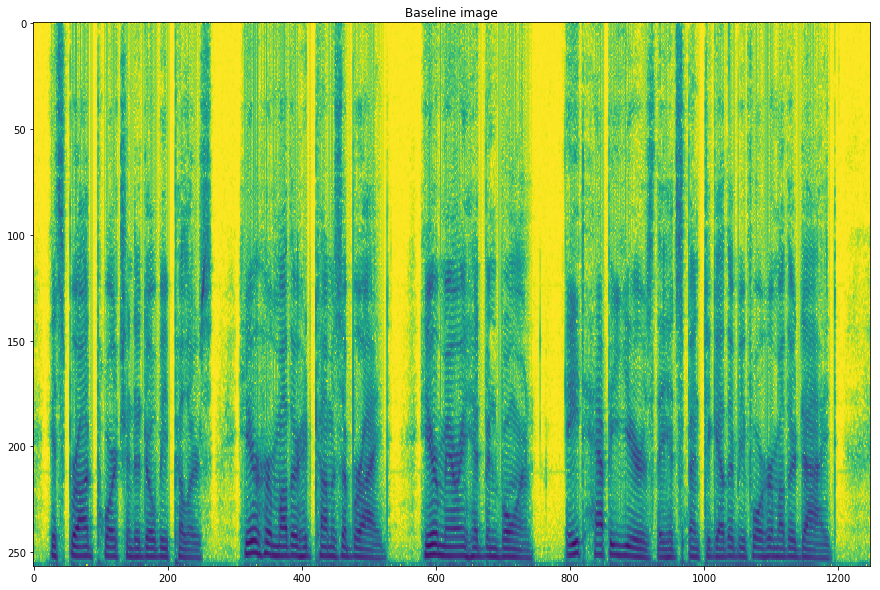

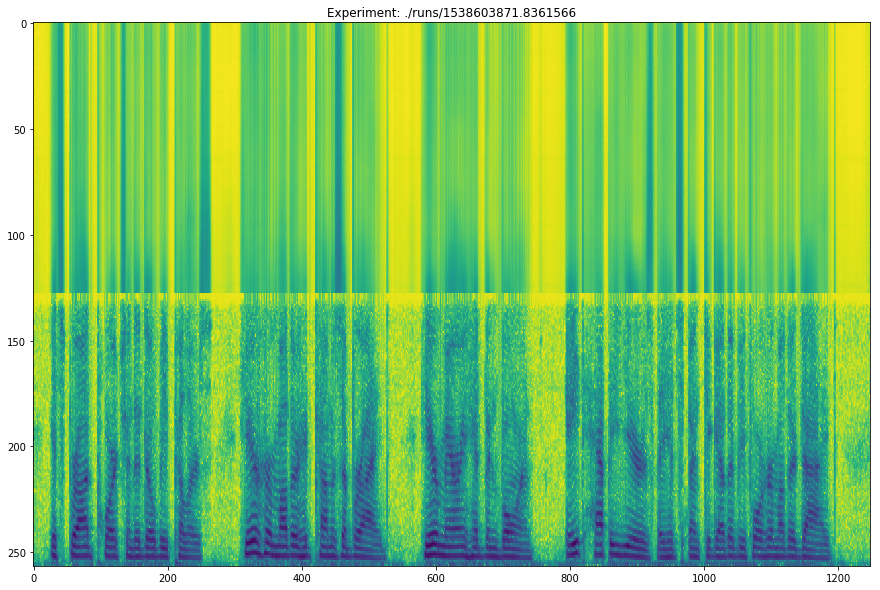

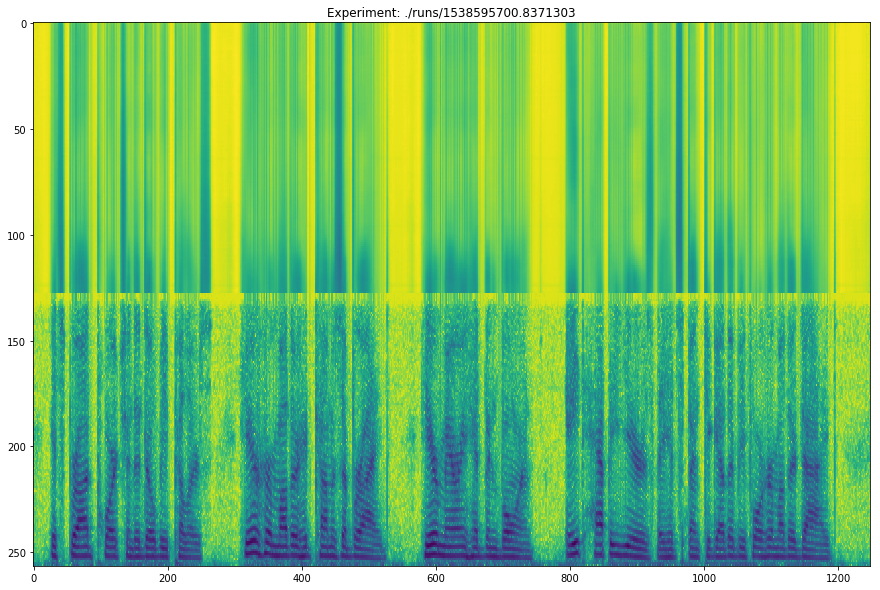

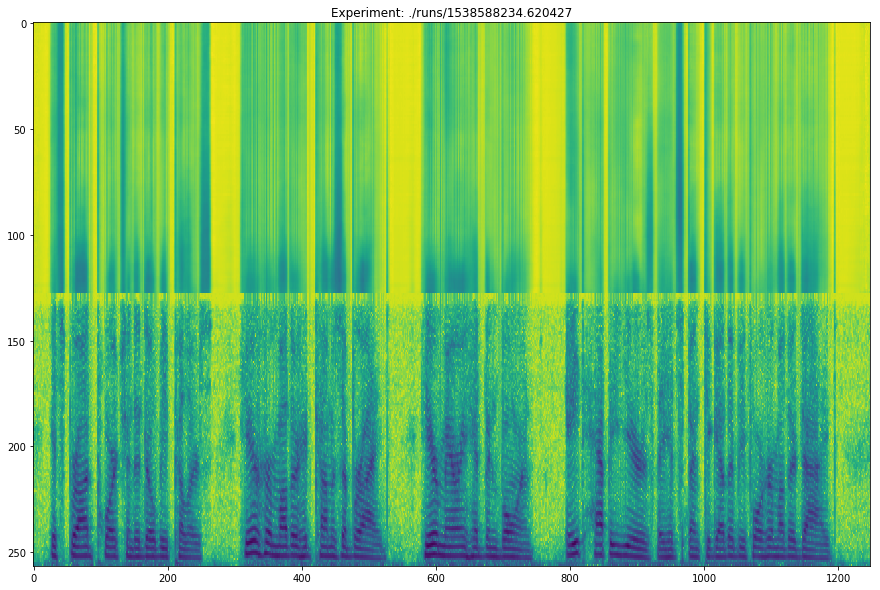

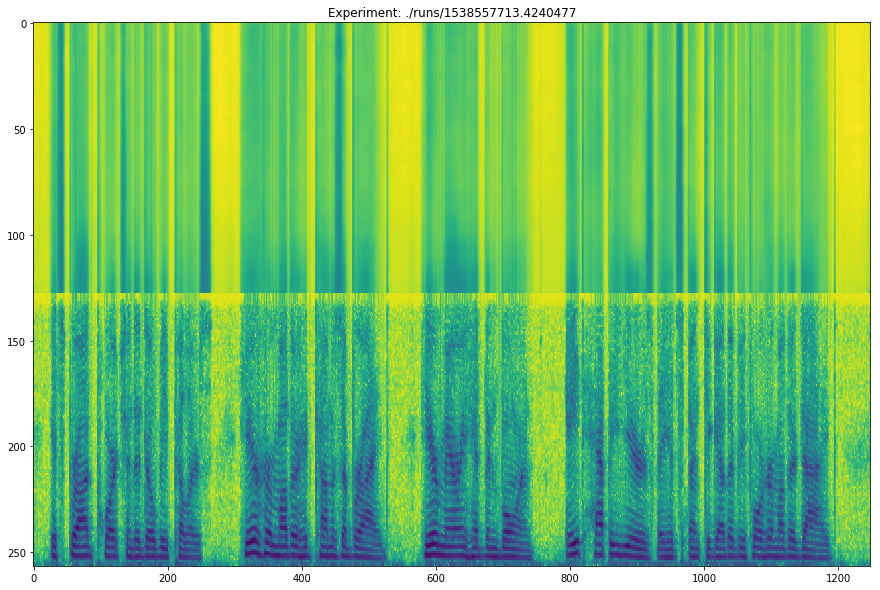

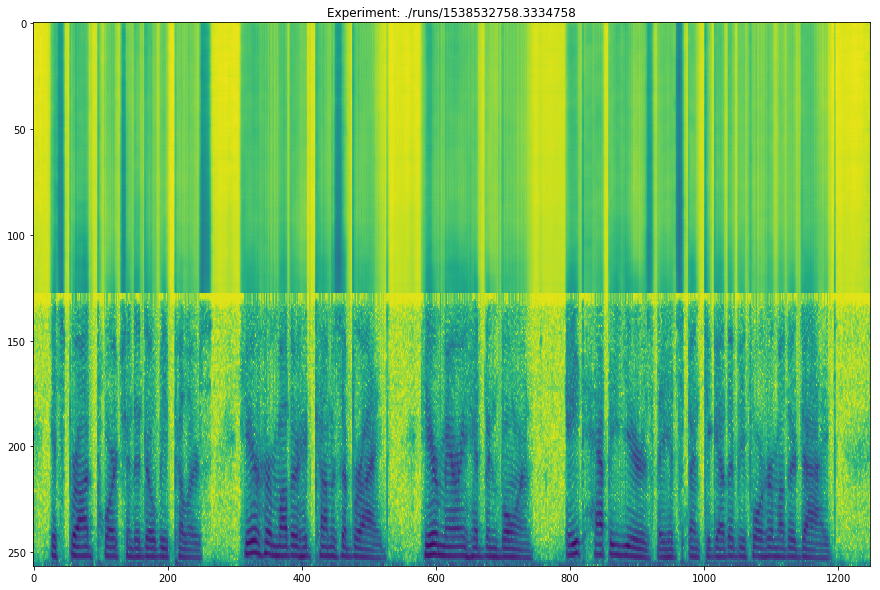

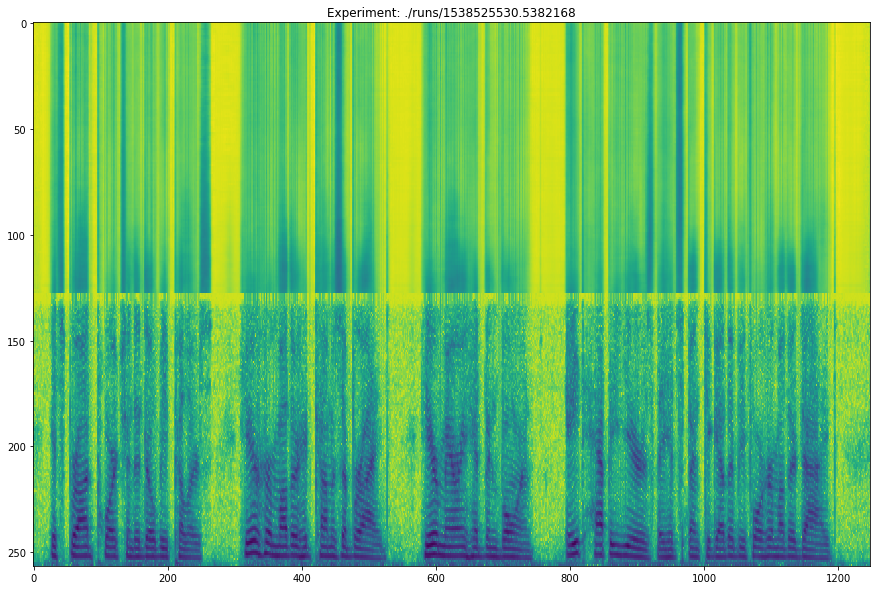

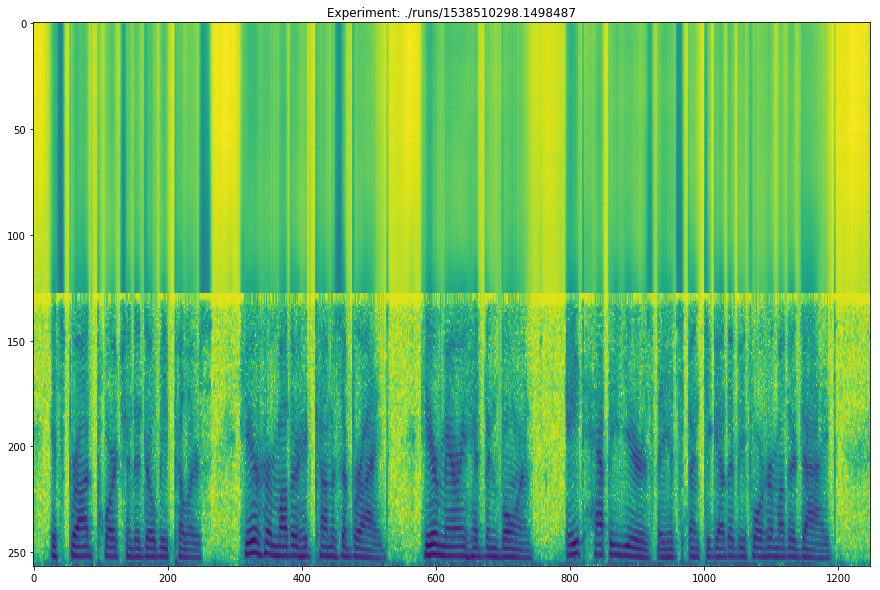

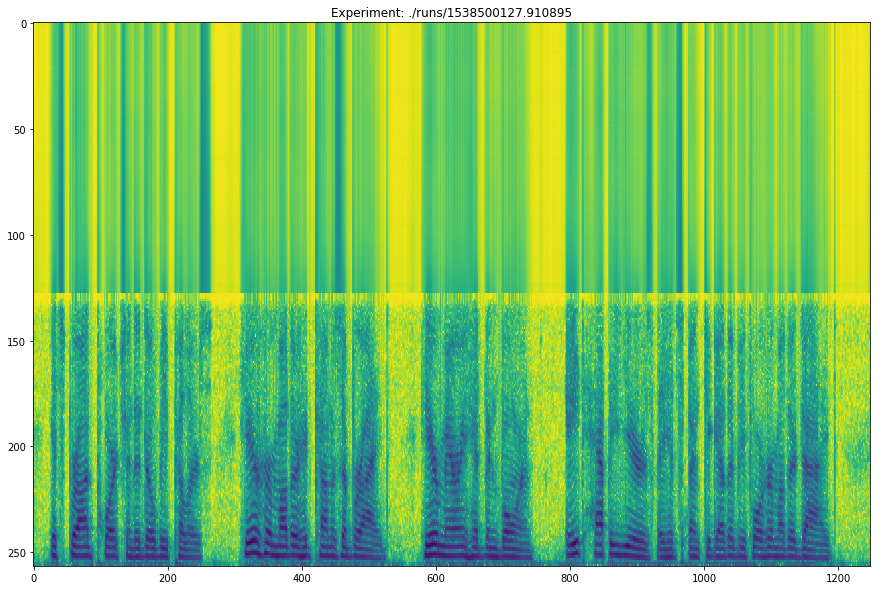

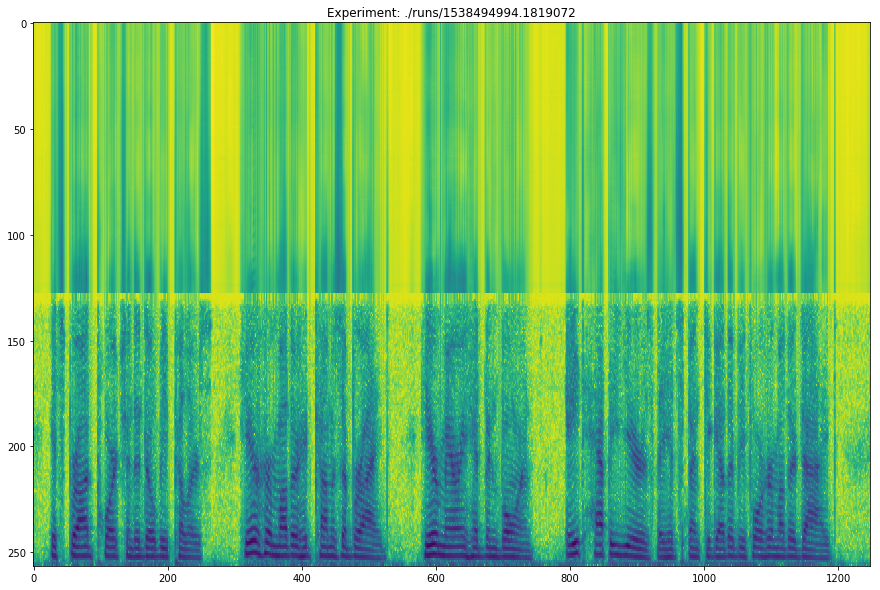

In [5]:
# visualisation

image, gt = test

plt.figure(figsize=(15,10))
plt.title("Baseline image")
plt.imshow(np.rot90(gt[0, :, :]), aspect='auto')
plt.show()

for name, mdl in zip(experiment_names, models):
    prediction = mdl.predict(image[:1])
    plt.figure(figsize=(15,10))
    plt.title("Experiment: " + name)
    plt.imshow(np.rot90(prediction[0, :, :]), aspect='auto')
    plt.show()

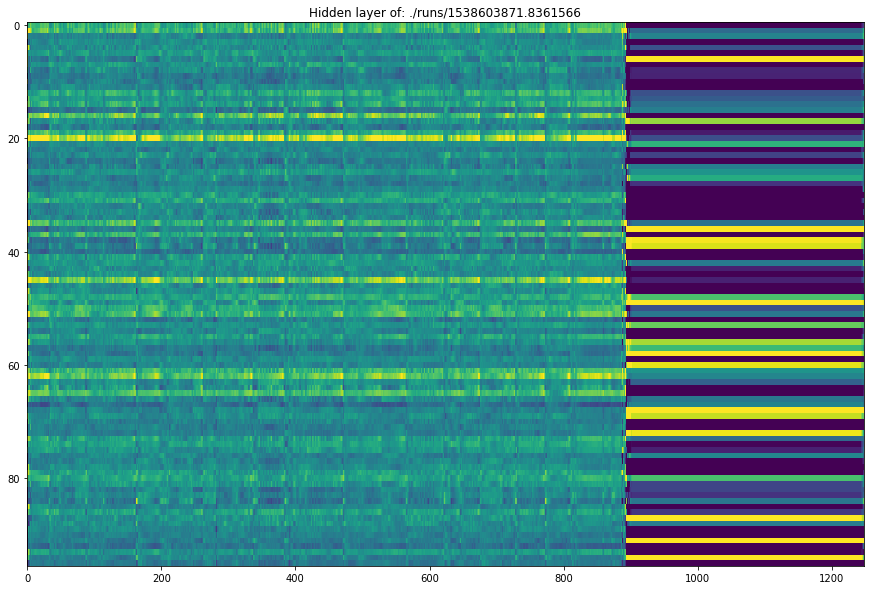

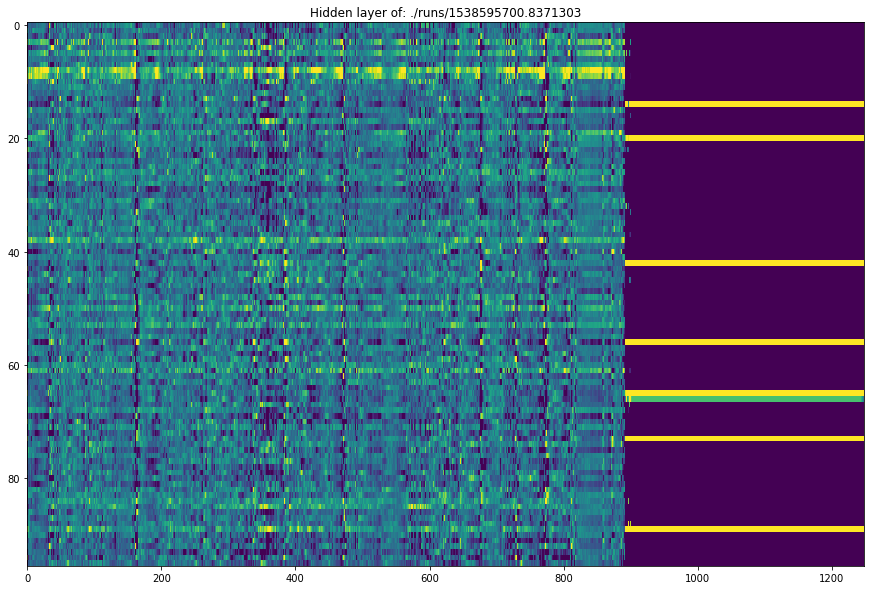

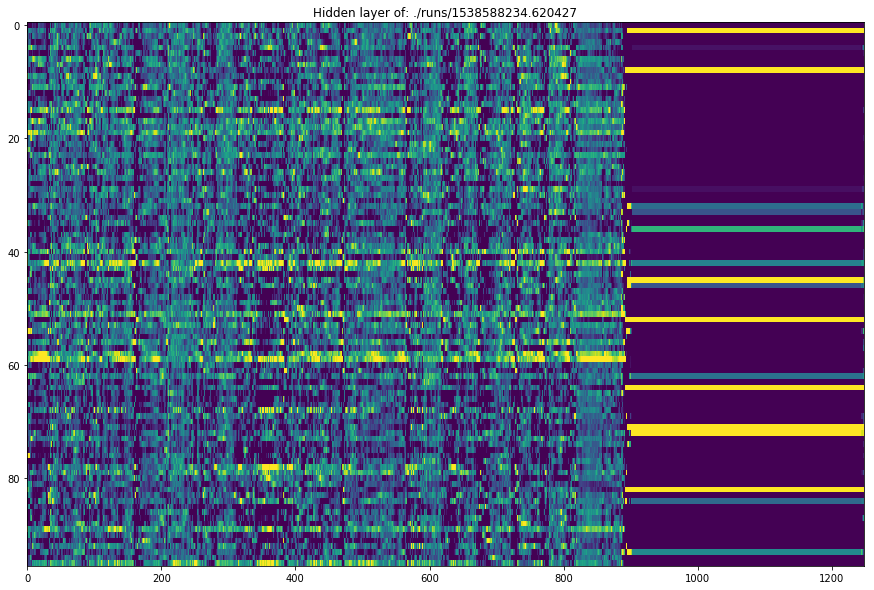

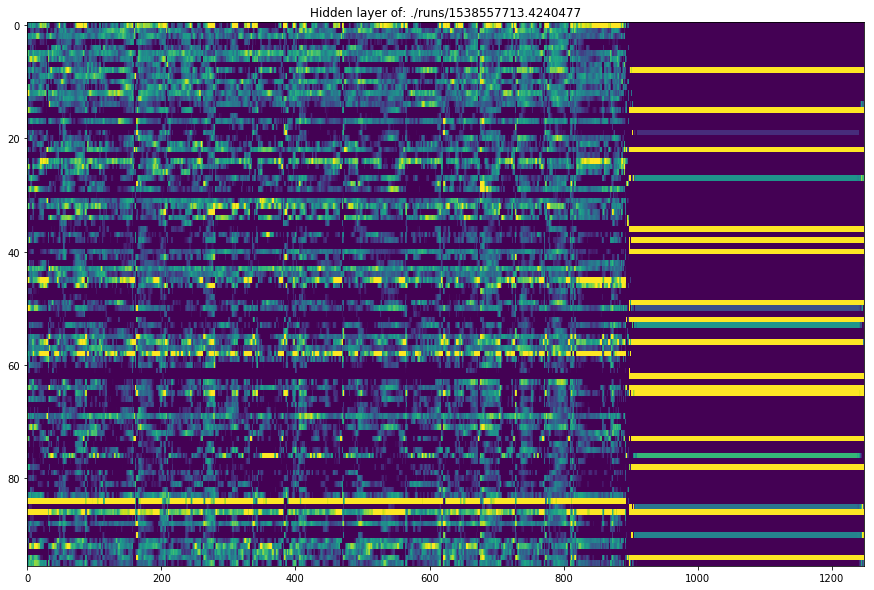

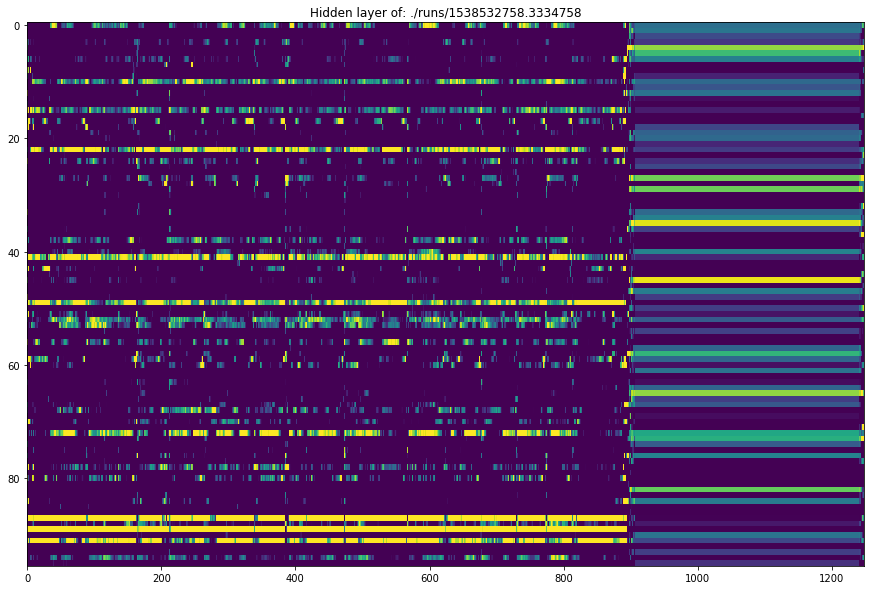

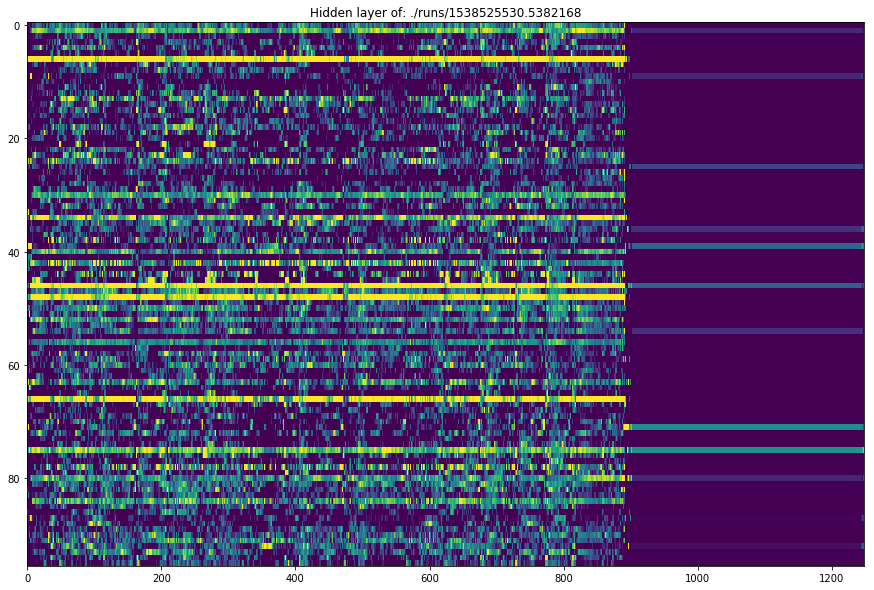

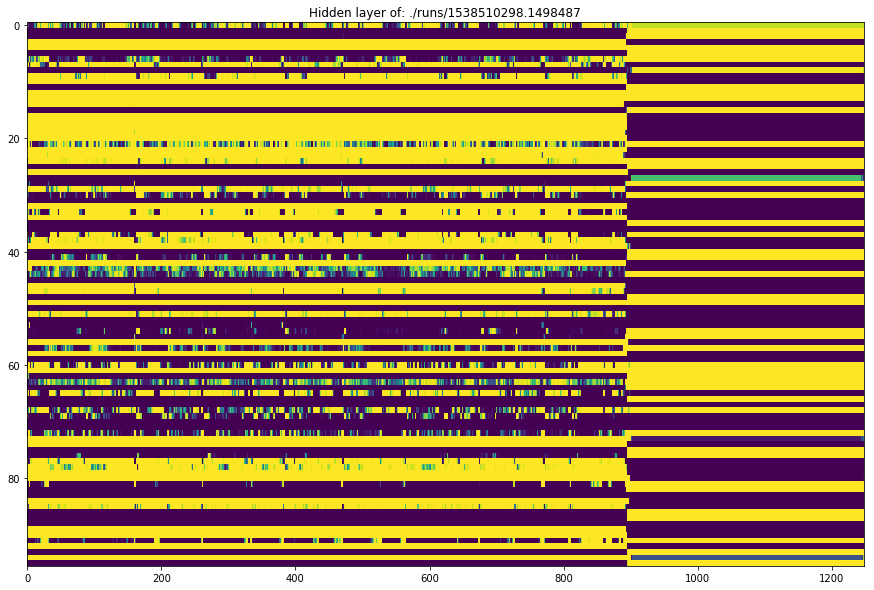

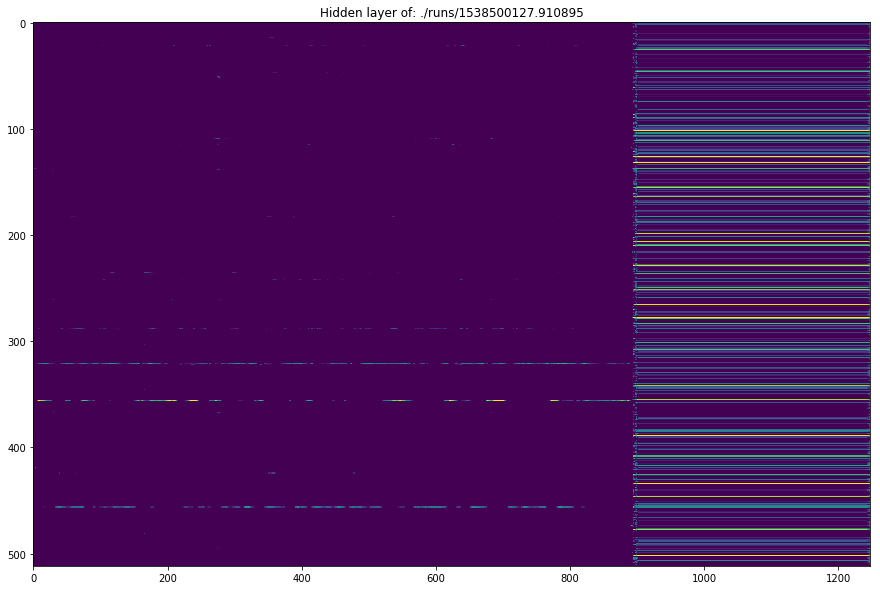

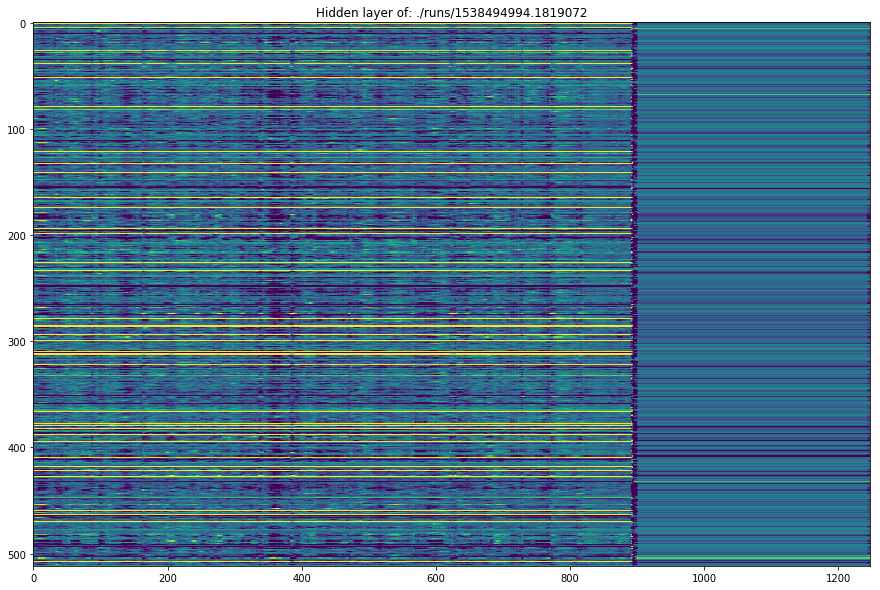

In [7]:
# hidden representation of each model - verify variability

image, gt = test

for name, mdl in zip(experiment_names, models):
    model = Model(mdl.input, [x.output for x in mdl.layers if x.name == "hidden"][0])
    prediction = model.predict(image[:1])
    plt.figure(figsize=(15,10))
    plt.title("Hidden layer of: " + name)
    plt.imshow(np.rot90(prediction[0, :, :]), aspect='auto', vmin=-1, vmax=1)
    plt.show()

Groundtruth signal


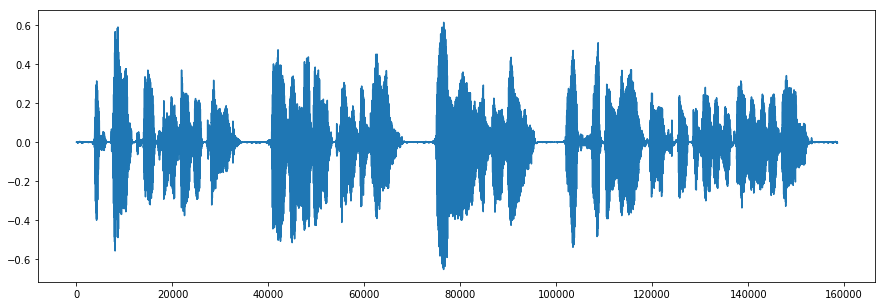

Input signal


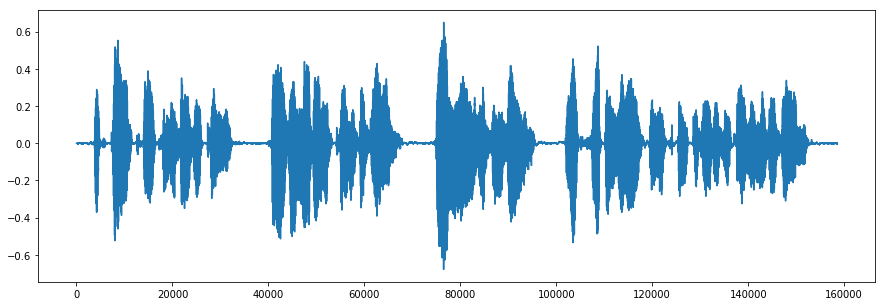

Prediction of ./runs/1538603871.8361566


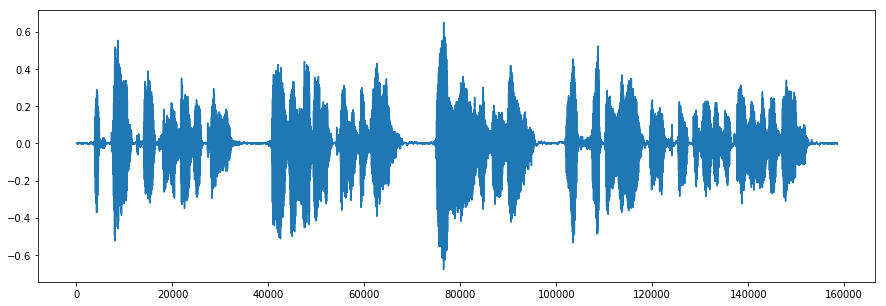

Prediction of ./runs/1538595700.8371303


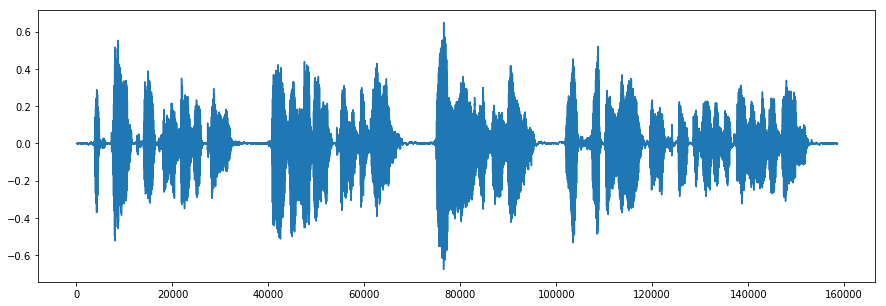

Prediction of ./runs/1538588234.620427


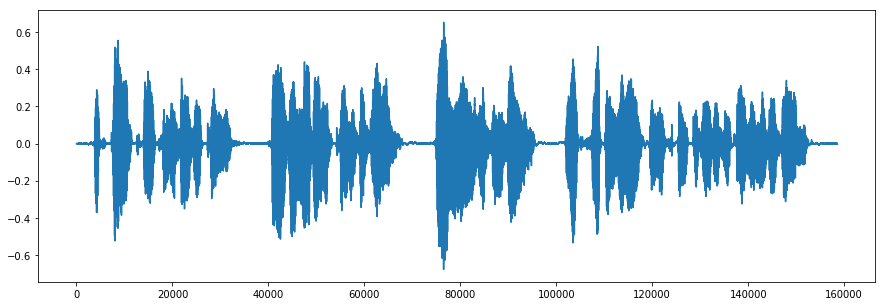

Prediction of ./runs/1538557713.4240477


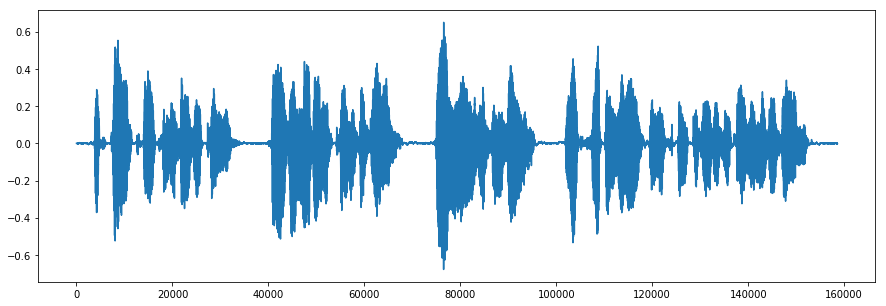

Prediction of ./runs/1538532758.3334758


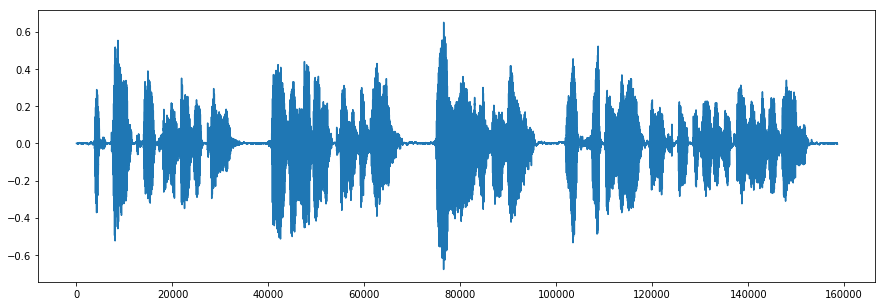

Prediction of ./runs/1538525530.5382168


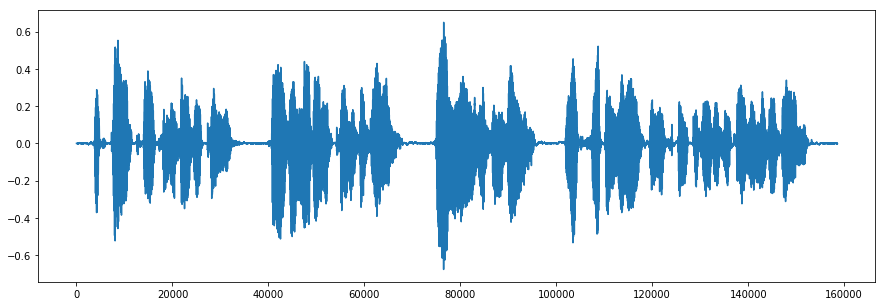

Prediction of ./runs/1538510298.1498487


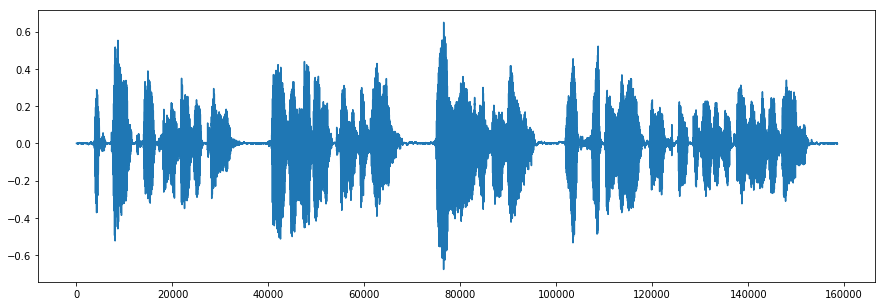

Prediction of ./runs/1538500127.910895


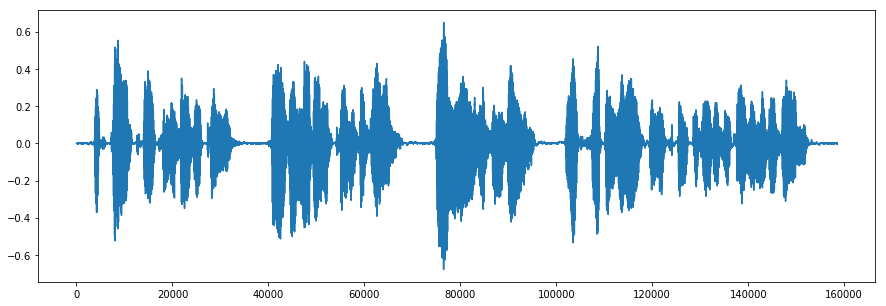

Prediction of ./runs/1538494994.1819072


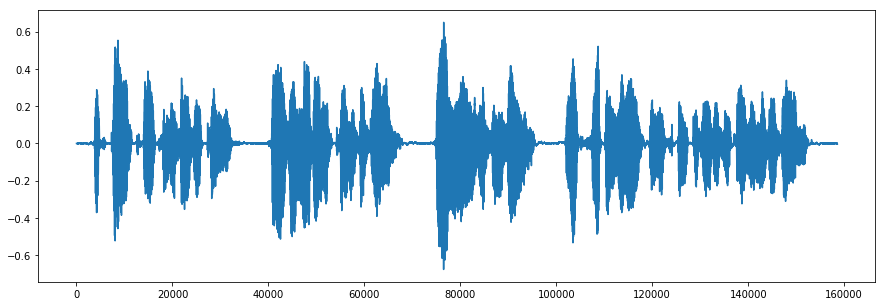

In [6]:
# predicted spectrograms

phase = gt[:] * 0
phase[:, :, :129] = orig_phase[:, :, :]
phase[:, :, 129:] = orig_phase[:, :, :0:-1]
window = np.hamming(512)

print("Groundtruth signal")
sound = gt[0] * STD + MEAN
spec = (np.sqrt(np.exp(-sound)) * 512) * np.exp(phase[0, :, :] * 1j)
length = len(np.where((gt[0, :, :] != 0).sum(1))[0]) - 4
sound = np.zeros(length * 128 + 512 - 128)
for i in range(length):
    frame = np.fft.irfft(spec[i,:])
    sound[128 * i : 128 * i + 512] += window * frame
plt.figure(figsize=(15,5))
plt.plot(sound[:-1024])
plt.show()
display(Audio(sound[:-1024], rate=16000))

print("Input signal")
sound = image[0] * STD + MEAN
spec = np.zeros(gt[0].shape, np.complex)
spec[:,:129] = (np.sqrt(np.exp(-sound)) * 512) * np.exp(phase[0, :, :129] * 1j)
sound = np.zeros(length * 128 + 512 - 128)
for i in range(length):
    frame = np.fft.irfft(spec[i,:])
    sound[128 * i : 128 * i + 512] += window * frame
plt.figure(figsize=(15,5))
plt.plot(sound[:-1024])
plt.show()
display(Audio(sound[:-1024], rate=16000))


for name, mdl in zip(experiment_names, models):
    print("Prediction of " + name)
    spec = mdl.predict(image[:1])[0]
    sound = np.zeros(length * 128 + 512 - 128)
    spec *= STD
    spec += MEAN
    spec = (np.sqrt(np.exp(-spec)) * 512) * np.exp(phase[0, :, :] * 1j)
    for i in range(length):
        frame = np.fft.irfft(spec[i,:])
        sound[128 * i : 128 * i + 512] += window * frame
    plt.figure(figsize=(15,5))
    plt.plot(sound[:-1024])
    plt.show()
    display(Audio(sound[:-1024], rate=16000))


##### Metrics

In [7]:
import subprocess
import re

def pesq(gt, pred, phase):
    spec = (np.sqrt(np.exp(-gt)) * 512) * np.exp(phase * 1j)
    sound = np.zeros(spec.shape[0] * 128 + 512 - 128)
    for i in range(spec.shape[0]):
        frame = np.fft.irfft(spec[i,:])
        sound[128 * i : 128 * i + 512] += frame
    spec = (np.sqrt(np.exp(-pred)) * 512) * np.exp(phase * 1j)
    sound2 = np.zeros(spec.shape[0] * 128 + 512 - 128)
    for i in range(spec.shape[0]):
        frame = np.fft.irfft(spec[i,:])
        sound2[128 * i : 128 * i + 512] += frame
    fname_gt = tempfile.mktemp() + ".wav"
    fname_pred = tempfile.mktemp() + ".wav"
    # print(sound.shape, sound2.shape)
    sio.write(fname_gt, 16000, (2**15 * sound).astype(np.int16))
    sio.write(fname_pred, 16000, (2**15 * sound2).astype(np.int16))
    ot,e = subprocess.Popen(["PESQ", "+wb", "+16000", fname_gt, fname_pred], stdout = subprocess.PIPE, stderr = subprocess.PIPE).communicate()
    os.remove(fname_gt)
    os.remove(fname_pred)
    # print(ot)
    o = ot.decode("utf-8").split('\n')[-2]
    # print(o, len(o))
    # if not len(o):
    #     print(ot.decode("utf-8"))
    value = re.findall("= \d\.\d+", o)[0]
    # print(value)
    return float(value[2:])

inp, gtruth = test
n_phase = phase[:]
preds = gtruth * 0
preds[:, :, :129] = STD * inp + MEAN
quality = []
print(gtruth.shape, preds.shape, n_phase.shape)
gtruth = STD * gtruth + MEAN
for i in range(gtruth.shape[0]):
    try:
        quality.append(pesq(gtruth[i], preds[i], n_phase[i]))
    except IndexError:
        print("Failed getting PESQ value for recording {}".format(i))
print("No processing PESQ:", np.array(quality).mean())

quality_arrays = []

for name, mdl in zip(experiment_names, models):
    preds = mdl.predict(inp)
    # preds[:, :, :129] = gt[:, :, :129]
    preds = STD * preds + MEAN
    quality = []
    for i in range(gtruth.shape[0]):
        try:
            quality.append(pesq(gtruth[i], preds[i], n_phase[i]))
        except IndexError:
            print("Failed getting PESQ value for recording {}".format(i))
    print("Predicted by model {}:".format(name), np.array(quality).mean(), "+-", np.array(quality).std())
    quality_arrays.append(np.array(quality))

(80, 1248, 257) (80, 1248, 257) (80, 1248, 257)
No processing PESQ: 1.127475
Predicted by model ./runs/1538603871.8361566: 2.8103875 +- 0.6389205250606291
Predicted by model ./runs/1538595700.8371303: 2.8081625000000003 +- 0.6352943302861674
Predicted by model ./runs/1538588234.620427: 2.8291 +- 0.6121961409548414
Predicted by model ./runs/1538557713.4240477: 2.8125625 +- 0.6494909130186118
Predicted by model ./runs/1538532758.3334758: 2.799525 +- 0.6528881790743342
Predicted by model ./runs/1538525530.5382168: 2.7869125000000006 +- 0.6615810455596125
Predicted by model ./runs/1538510298.1498487: 2.7590375000000003 +- 0.6606736040540366
Predicted by model ./runs/1538500127.910895: 2.7422125 +- 0.6579096574331084
Predicted by model ./runs/1538494994.1819072: 2.77755 +- 0.6041776001309549


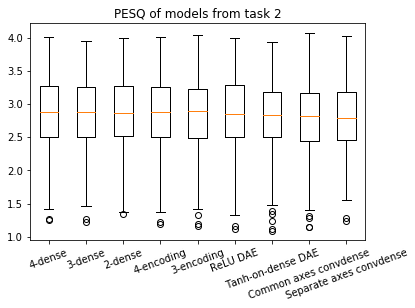

In [8]:
plot_model_names = list(reversed(["Separate axes convdense", "Common axes convdense", "Tanh-on-dense DAE", "ReLU DAE", "3-encoding", "4-encoding", "2-dense", "3-dense", "4-dense"]))
plt.boxplot(quality_arrays, labels=plot_model_names)
plt.xticks(rotation=20)
plt.title("PESQ of models from task 2")
plt.show()

[29, 16, 15, 20]


Text(0.5,1,'Percentage of preference across models, according to PESQ, task 2')

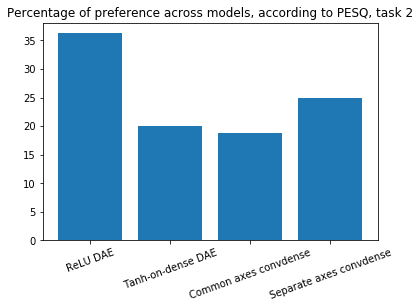

In [22]:
# old loaded data (seemingly ok): [7, 1, 7, 13, 15, 0, 7, 21, 9]

preferences = np.stack(quality_arrays[-4:]).argmax(0)
from collections import Counter

c = Counter(preferences)
prefs = [c[x] for x in range(4)]
print(prefs)
plt.bar(plot_model_names[-4:], np.array(prefs) / 80 * 100)
plt.xticks(rotation=20)
plt.title("Percentage of preference across models, according to PESQ, task 2")

In [11]:
# log power MSE

inp, gtruth = test
gtruth = STD * gtruth + MEAN
preds = gtruth * 0
preds[:, :, :129] = STD * inp + MEAN
logmse=[]
for i in range(gtruth.shape[0]):
    length = len(np.where((gtruth[i, :, :] != 0).sum(1))[0])
    logmse.append(((preds[i, :length, :] - gtruth[i, :length, :]) ** 2).mean())
print("Baseline log-power MSE:", np.array(logmse).mean())

for name, mdl in zip(experiment_names, models):
    logmse=[]
    preds = STD * mdl.predict(inp) + MEAN
    for i in range(gtruth.shape[0]):
        length = len(np.where((gtruth[i, :, :] != 0).sum(1))[0])
        logmse.append(((preds[i, :length, :] - gtruth[i, :length, :]) ** 2).mean())
    print("Log-power MSE of {}:".format(name), np.array(logmse).mean(), "+-", np.array(logmse).std())


Baseline log-power MSE: 243.92412
Log-power MSE of ./runs/1538603871.8361566: 3.8054745 +- 0.882397
Log-power MSE of ./runs/1538595700.8371303: 3.8228784 +- 0.8966365
Log-power MSE of ./runs/1538588234.620427: 3.8674667 +- 0.9512647
Log-power MSE of ./runs/1538557713.4240477: 3.7262511 +- 0.76655674
Log-power MSE of ./runs/1538532758.3334758: 3.765676 +- 0.7673328
Log-power MSE of ./runs/1538525530.5382168: 3.863462 +- 0.9102501
Log-power MSE of ./runs/1538510298.1498487: 3.8700595 +- 0.8349433
Log-power MSE of ./runs/1538500127.910895: 3.907065 +- 0.8217695
Log-power MSE of ./runs/1538494994.1819072: 3.8088577 +- 0.8633411


In [13]:
# log-spectral distance


inp, gtruth = test
gtruth = STD * gtruth + MEAN
preds = gtruth * 0
preds[:, :, :129] = STD * inp + MEAN
lsd = []
innermost = (10 * ((-preds) - (-gtruth)) / np.log(10)) ** 2
for i in range(gtruth.shape[0]):
    inner = innermost[i, :, :]
    length = len(np.where((gtruth[i, :, :] != 0).sum(1))[0])
    inner = inner[:length]
    sublsd = []
    for t in range(length):
        step = 2 / 513
        frame = inner[t]
        integral = frame.sum()
        sublsd.append(np.sqrt(step * integral))
    lsd.append(np.array(sublsd).mean())
print("Log-spectral distance of baseline:", np.array(lsd).mean())

for name, mdl in zip(experiment_names, models):
    preds = STD * mdl.predict(inp) + MEAN
    lsd = []
    innermost = (10 * ((-preds) - (-gtruth)) / np.log(10)) ** 2
    for i in range(gtruth.shape[0]):
        inner = innermost[i, :, :]
        length = len(np.where((gtruth[i, :, :] != 0).sum(1))[0])
        inner = inner[:length]
        sublsd = []
        for t in range(length):
            step = 2 / 513
            frame = inner[t]
            integral = frame.sum()
            sublsd.append(np.sqrt(step * integral))
        lsd.append(np.array(sublsd).mean())
    print("Log-spectral distance of {}:".format(name), np.array(lsd).mean(), "+-", np.array(lsd).std())

Log-spectral distance of baseline: 67.30242448613738
Log-spectral distance of ./runs/1538603871.8361566: 8.162081417167055 +- 0.8582610972902334
Log-spectral distance of ./runs/1538595700.8371303: 8.19057018072994 +- 0.8779030439041493
Log-spectral distance of ./runs/1538588234.620427: 8.233946320875447 +- 0.9166131604330975
Log-spectral distance of ./runs/1538557713.4240477: 8.105042637891978 +- 0.7726151929194195
Log-spectral distance of ./runs/1538532758.3334758: 8.143977247313945 +- 0.7771406256893104
Log-spectral distance of ./runs/1538525530.5382168: 8.220700163784366 +- 0.8806036607995178
Log-spectral distance of ./runs/1538510298.1498487: 8.24101633320775 +- 0.8275506556381083
Log-spectral distance of ./runs/1538500127.910895: 8.257650283681533 +- 0.8245383280237776
Log-spectral distance of ./runs/1538494994.1819072: 8.154877018540152 +- 0.8562969717066464


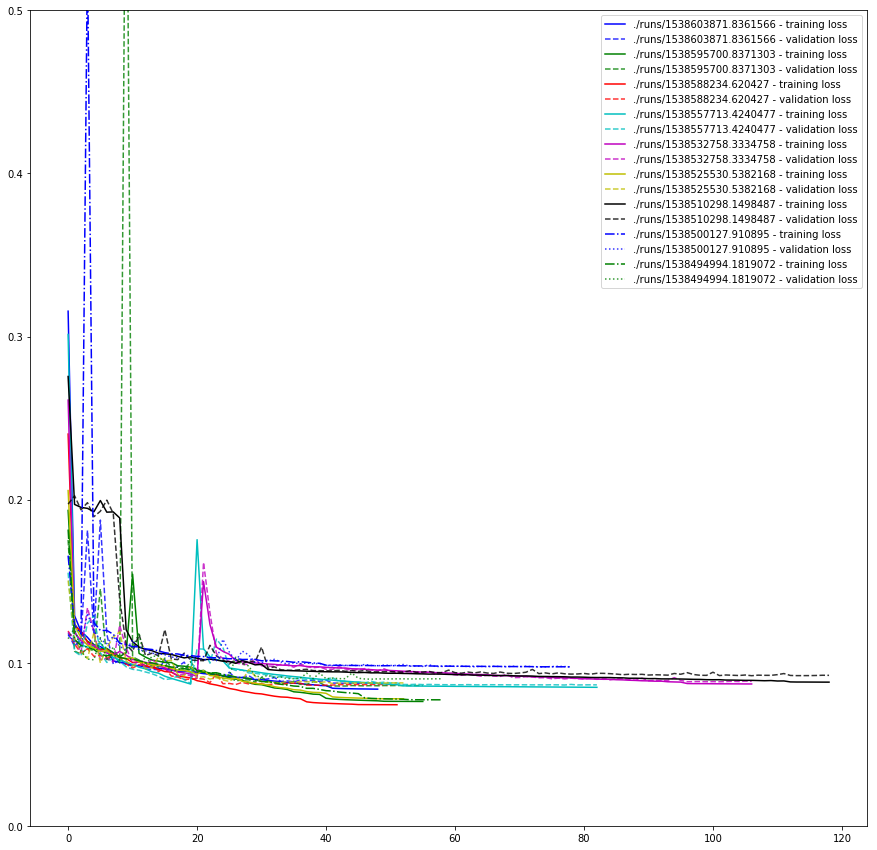

In [33]:
legend_labels = []
colors = "bgrcmykbgrcmyk"
train_linestyles = ["-"] * 7 + ["-."] * 7
val_linestyles = ["--"] * 7 + ["dotted"] * 7
plt.figure(figsize=(15,15))
for color, tl, vl, model in zip(colors, train_linestyles, val_linestyles, experiment_names):
    with open(model + "/history.pkl", "rb") as f:
        hist = pickle.load(f)
    loss = hist['loss']
    if type(loss[0]) == list:
        print("Model {} has multiple losses - not plotted".format(model))
    else:
        legend_labels.append(model + " - training loss")
        plt.plot(loss, linestyle=tl, color=color)    
        val_loss = hist['val_loss']
        plt.plot(val_loss, linestyle=vl, color=color, alpha=0.8)
        legend_labels.append(model + " - validation loss")
plt.legend(legend_labels)
plt.ylim(0,0.5)
plt.show()

In [34]:
models[3].layers

# Conclusions

#### Which models have optimal metrics?

As we can see, best PESQ is obtained by autoencoding models as well as slightly better MSE. It may suggest that while Dense are more capable of modelling harmonic structure, they generally don't capture the essence of the speech pretty well. 

Best PESQ: first model - the 4-Dense autoencoder

Best MSE: fourth model - the autoencoder with longer encoding (more convolutional layers)

Loss - best validation loss was attained by third model (which model is it)?

Please note, we used 4500 recordings here...

However, the results may be non conclusive due to small differences.